In [6]:
from yuning_util.dev_mode import DevMode
dev_mode = DevMode('k-seq')
dev_mode.on()

from importlib import reload
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('seaborn')
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 240

In [7]:
from k_seq.utility.file_tools import read_pickle

In [8]:
def load_results(dataset_dir, result_dir, input_counts=True):
    """Survey estimation results"""
    
    import pandas as pd
    from k_seq.utility.file_tools import read_pickle
    
    results = pd.read_csv(f'{result_dir}/fit_summary.csv', index_col=0)
    seq_list = results[~results.isna().any(axis=1)].index.values
    
    truth = pd.read_csv(f'{dataset_dir}/truth.csv')
    if input_counts:
        truth['input_counts'] = read_pickle(f'{dataset_dir}/seq_table.pkl').table.s0
    
    return results, truth, seq_list
    

In [25]:
results, truth, seq_list = load_results(
    dataset_dir='/mnt/storage/projects/k-seq/datasets/simulated/on_doped_s1000000_d40/',
    result_dir='/mnt/storage/projects/k-seq/working/simu_data/least_squared/table-all-seq_bs-num-0_bs-mtd-data_no-zero-false_inv-weight-false_core-20/'
)

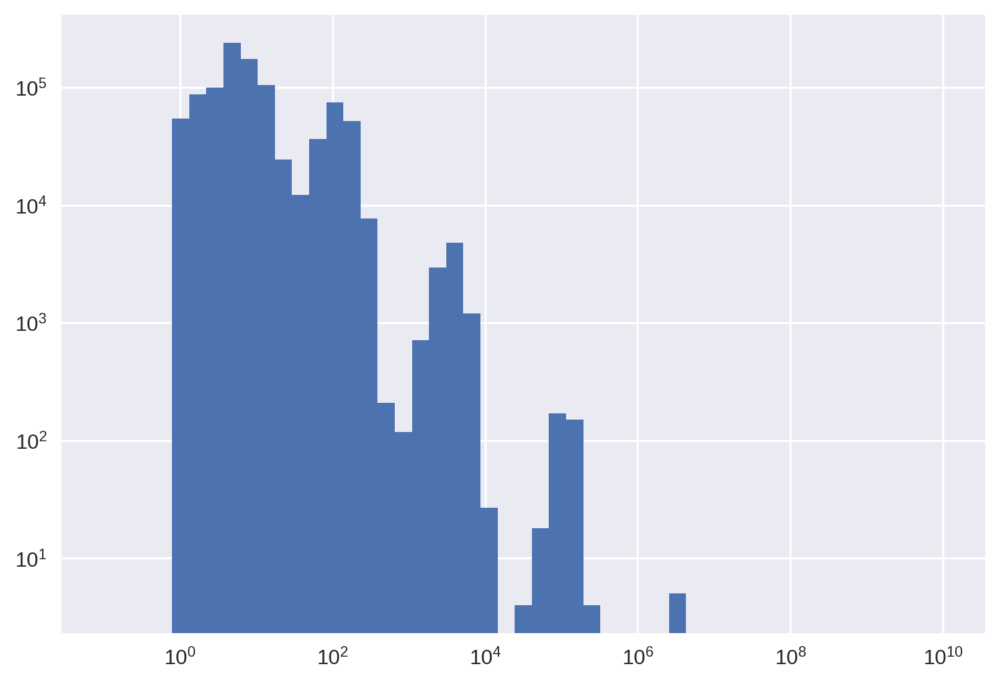

In [43]:
bins = np.logspace(-1, 10, 50)
truth.input_counts.hist(bins=bins)
plt.xscale('log')
plt.yscale('log')
plt.show()

In [9]:
def align_to_truth(df_res, df_truth, cols, lims=None, use_log=None, labels=None, input_lim=None, markersize=5, figsize=None):
    
    if input_lim:
        seq_list = df_truth[(input_lim[0] <= df_truth['input_counts']) &  (df_truth['input_counts'] < input_lim[1])].index.values
    fig_num = len(cols)
    if not figsize:
        figsize = [4 * fig_num, 4]
    fig, axes = plt.subplots(1, fig_num, figsize=figsize)
    if fig_num == 1:
        axes = [axes]
    for ix, (col, ax) in enumerate(zip(cols, axes)):
        if isinstance(col, str):
            col = (col, col)
        est = df_res[col[0]][seq_list]
        truth = df_truth[col[1]][seq_list]
        ax.scatter(truth, est, marker='.', s=markersize, alpha=0.3)
           
        if not lims:
            xlims = ax.get_xlim()
            ylims = ax.set_ylim()
            lim = (min(xlims[0], ylims[0]), max(xlims[1], ylims[1]))
        else:
            lim = lims[ix]
        
        if use_log and use_log[ix]:
            ax.set_xscale('log')
            ax.set_yscale('log')
            
        ax.plot(lim, lim, '--', alpha=0.6)
        ax.set_xlim(lim)
        ax.set_ylim(lim)
        ax.set_xlabel(f"True {labels[ix].lower()}" if labels else "Truth", fontsize=12)
        ax.set_ylabel(f"Estimated {labels[ix].lower()}" if labels else "Estimation", fontsize=12)
    plt.tight_layout()

(0, 100.0)


/home/yuning/.pyenv/versions/anaconda3-5.0.1/envs/k-seq/lib/python3.7/site-packages/pandas/core/indexing.py:2418: FutureWarning: DataFrame/Series.to_dense is deprecated and will be removed in a future version
  result = result.to_dense()


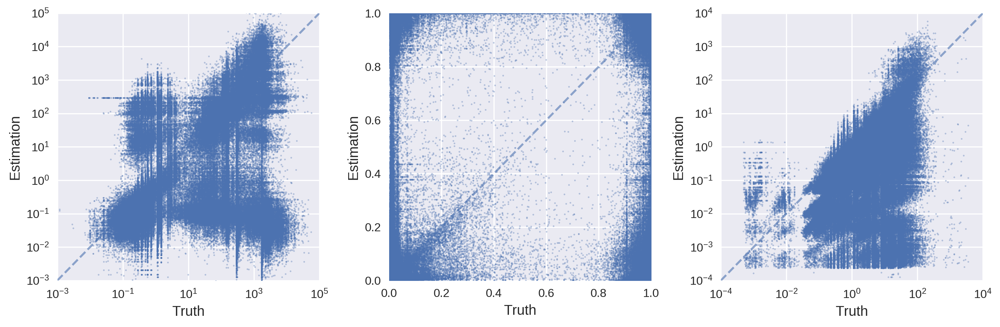

(100.0, 10000.0)


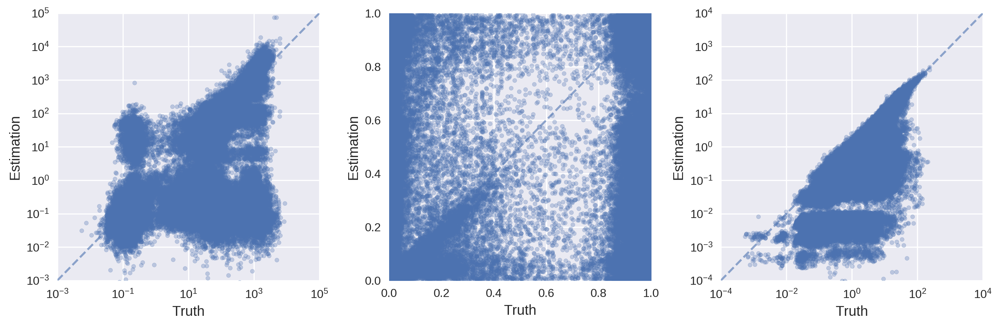

(10000.0, 1000000.0)


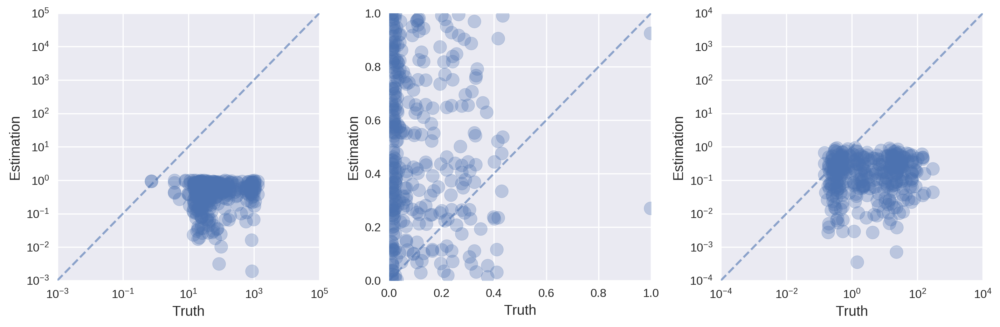

(1000000.0, 100000000.0)


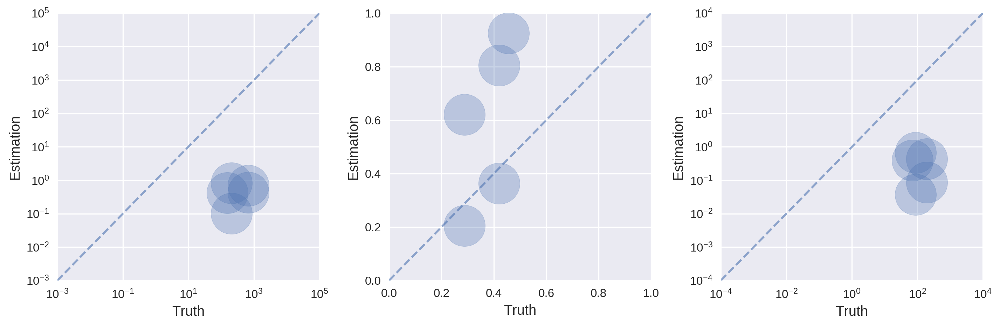

In [81]:
results, truth, seq_list = load_results(
    dataset_dir='/mnt/storage/projects/k-seq/datasets/simulated/on_doped_s1000000_d40/',
    result_dir='/mnt/storage/projects/k-seq/working/simu_data/least_squared/table-all-seq_bs-num-0_bs-mtd-data_no-zero-false_inv-weight-true_core-20/'
)

input_lim_list = [(0, 1e2),
                  (1e2, 1e4),
                  (1e4, 1e6),
                  (1e6, 1e8)]


for input_lim in input_lim_list:
    print(input_lim)
    align_to_truth(df_res=results.loc[seq_list], df_truth=truth.loc[seq_list],
                   cols=['k', 'A', ('kA', 'ka')],
                   lims=[(1e-3, 1e5), (0, 1), (1e-4, 1e4)],
                   use_log=[True, False, True],
                   input_lim=input_lim,
                   markersize=np.sqrt(input_lim[1]) / 2
                  )
    plt.show()

(0, 100.0)


/home/yuning/.pyenv/versions/anaconda3-5.0.1/envs/k-seq/lib/python3.7/site-packages/pandas/core/indexing.py:2418: FutureWarning: DataFrame/Series.to_dense is deprecated and will be removed in a future version
  result = result.to_dense()


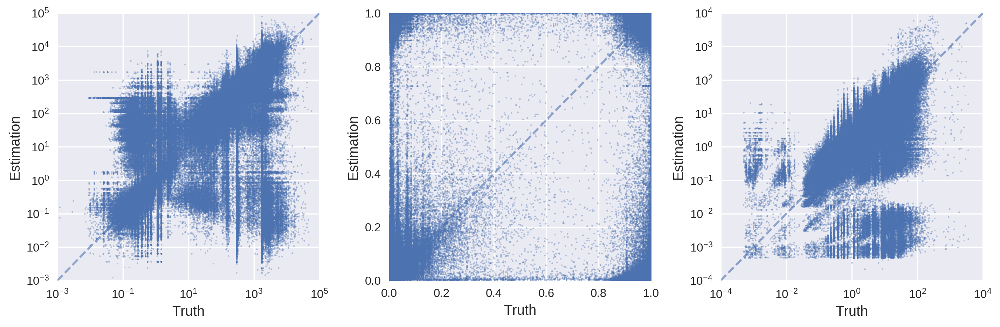

(100.0, 10000.0)


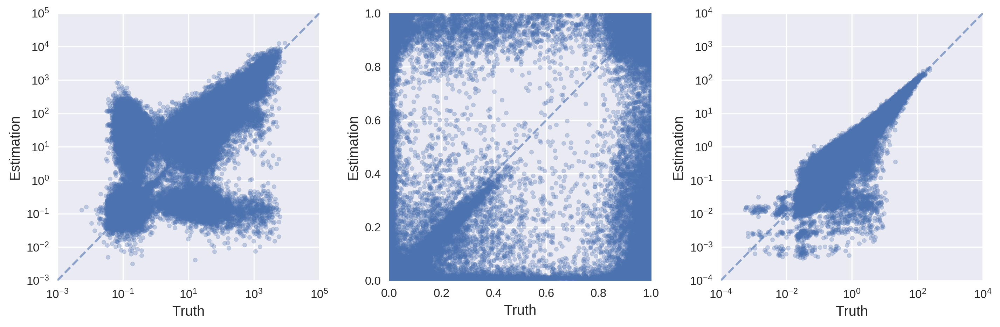

(10000.0, 1000000.0)


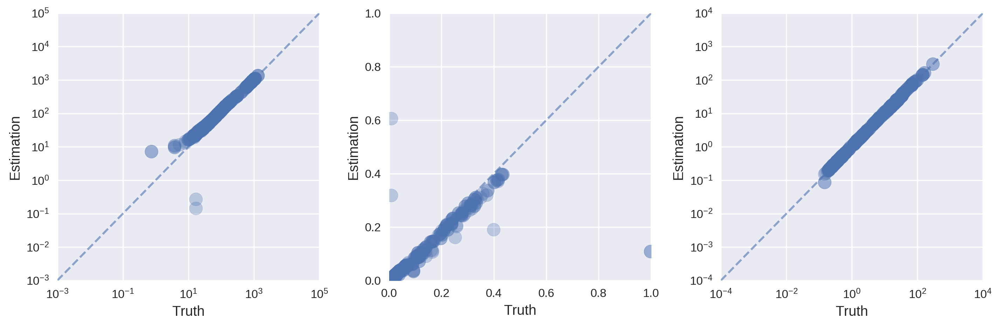

(1000000.0, 100000000.0)


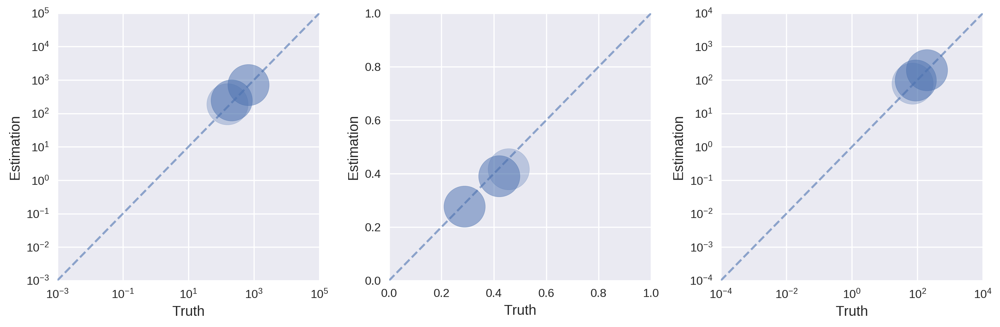

In [52]:
results, truth, seq_list = load_results(
    dataset_dir='/mnt/storage/projects/k-seq/datasets/simulated/on_doped_s1000000_d40/',
    result_dir='/mnt/storage/projects/k-seq/working/simu_data/least_squared/table-all-seq_bs-num-0_bs-mtd-data_no-zero-false_inv-weight-false_core-20/'
)

input_lim_list = [(0, 1e2),
                  (1e2, 1e4),
                  (1e4, 1e6),
                  (1e6, 1e8)]


for input_lim in input_lim_list:
    print(input_lim)
    align_to_truth(df_res=results.loc[seq_list], df_truth=truth.loc[seq_list],
                   cols=['k', 'A', ('kA', 'ka')],
                   lims=[(1e-3, 1e5), (0, 1), (1e-4, 1e4)],
                   use_log=[True, False, True],
                   input_lim=input_lim,
                   markersize=np.sqrt(input_lim[1]) / 2
                  )
    plt.show()

(0, 100.0)


/home/yuning/.pyenv/versions/anaconda3-5.0.1/envs/k-seq/lib/python3.7/site-packages/pandas/core/indexing.py:2418: FutureWarning: DataFrame/Series.to_dense is deprecated and will be removed in a future version
  result = result.to_dense()


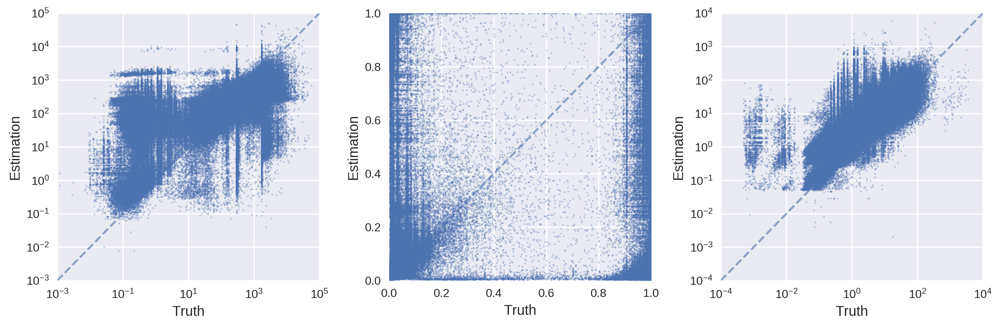

(100.0, 10000.0)


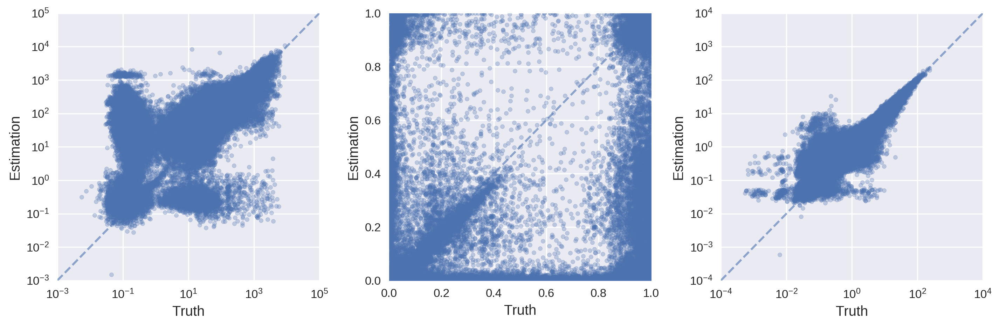

(10000.0, 1000000.0)


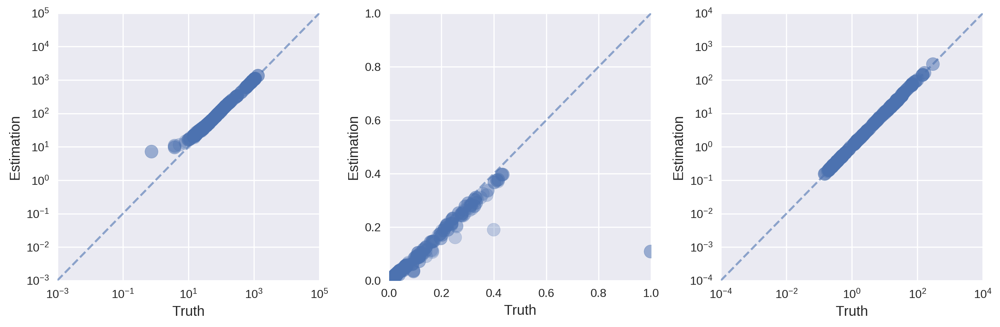

(1000000.0, 100000000.0)


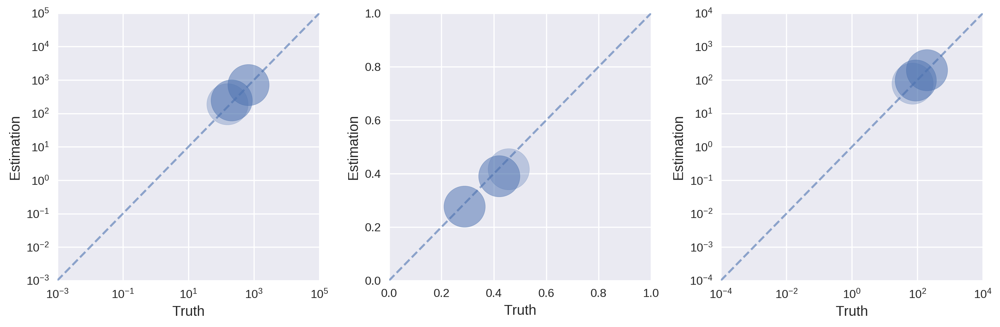

In [80]:
results, truth, seq_list = load_results(
    dataset_dir='/mnt/storage/projects/k-seq/datasets/simulated/on_doped_s1000000_d40/',
    result_dir='/mnt/storage/projects/k-seq/working/simu_data/least_squared/table-all-seq_bs-num-0_bs-mtd-data_no-zero-true_inv-weight-false_core-20/'
)

input_lim_list = [(0, 1e2),
                  (1e2, 1e4),
                  (1e4, 1e6),
                  (1e6, 1e8)]


for input_lim in input_lim_list:
    print(input_lim)
    align_to_truth(df_res=results.loc[seq_list], df_truth=truth.loc[seq_list],
                   cols=['k', 'A', ('kA', 'ka')],
                   lims=[(1e-3, 1e5), (0, 1), (1e-4, 1e4)],
                   use_log=[True, False, True],
                   input_lim=input_lim,
                   markersize=np.sqrt(input_lim[1]) / 2
                  )
    plt.show()

In [ ]:
def percent_error(df_res, df_truth, xcol, ycol='ka',
                  xlog=False, ylog=False, xlabel=None, ylabel=None, xlim=None, ylim=None,
                  markersize=5, figsize=None):
    
    if not figsize:
        figsize = [8, 4]
    fig, ax = plt.subplots(1, 1, figsize=figsize)
    
    if isinstance(ycol, str):
        ycol = (ycol, ycol)
    est = df_res[ycol[0]]
    truth = df_truth[ycol[1]]
    error = (est - truth) / truth
    x = df_truth[xcol]
    ax.scatter(x[error > 0], error[error > 0], color='#2C73B4', marker='.', s=markersize, alpha=0.3)
    ax.scatter(x[error < 0], - error[error < 0], color='#F39730', marker='.', s=markersize, alpha=0.3)
    
    if xlog:
        ax.set_xscale('log')
    if ylog:
        ax.set_yscale('log', linthresh=10)
    ax.set_xlabel(xlabel if xlabel else xcol, fontsize=14)
    ax.set_ylabel(ylabel if ylabel else f"Percent error of {ycol[0]}", fontsize=14)
        
    if xlim:
        ax.set_xlim(xlim)
    if ylim:
        ax.set_ylim(ylim)
    plt.tight_layout()

In [ ]:
percent_error(df_res=results, df_truth=truth, xcol='input_counts', ycol=('kA', 'ka'),
             xlog=True, ylog=True, markersize=10, xlim=(1e-1, 1e8), ylim=(1e-5, 1e5))

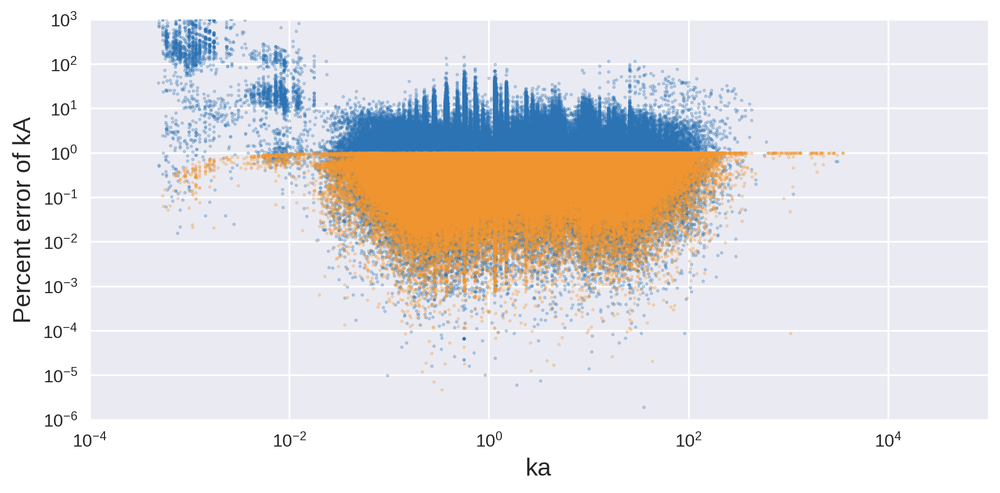

In [79]:
percent_error(df_res=results, df_truth=truth, xcol='ka', ycol=('kA', 'ka'),
              xlog=True, ylog=True, markersize=10, xlim=(1e-4, 1e5), ylim=(1e-6, 1e3))

# Sequencing depth

(0, 10)


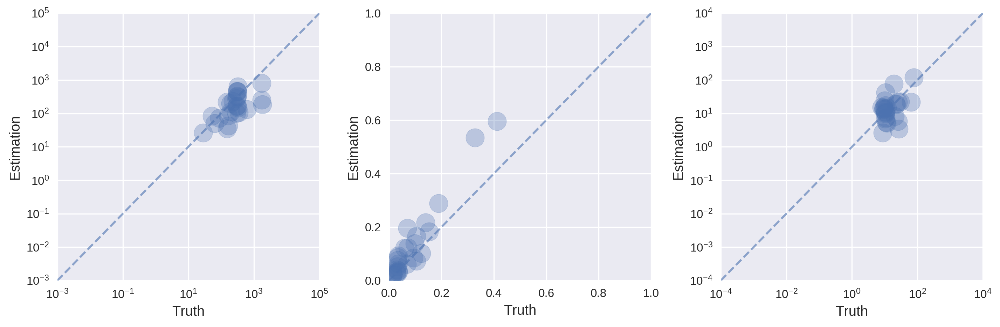

(10, 100)


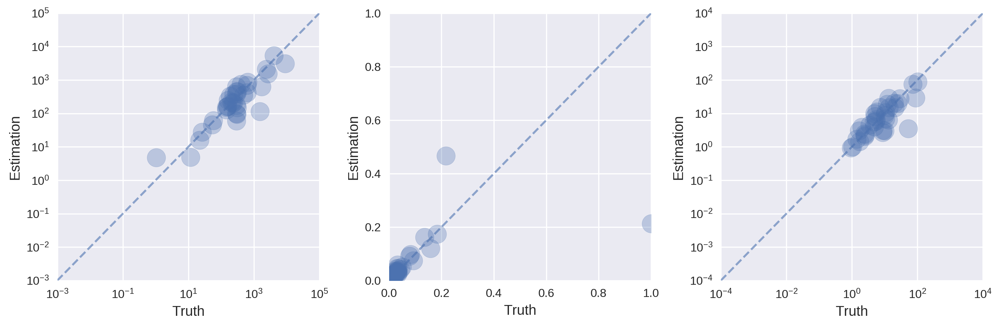

(100, 1000)


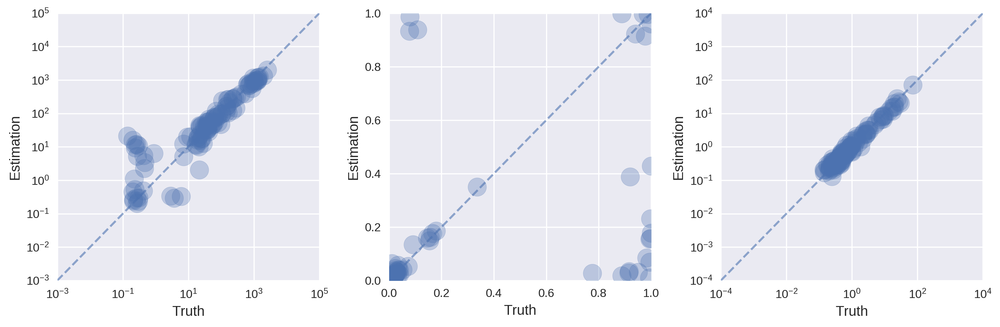

(1000, 100000000.0)


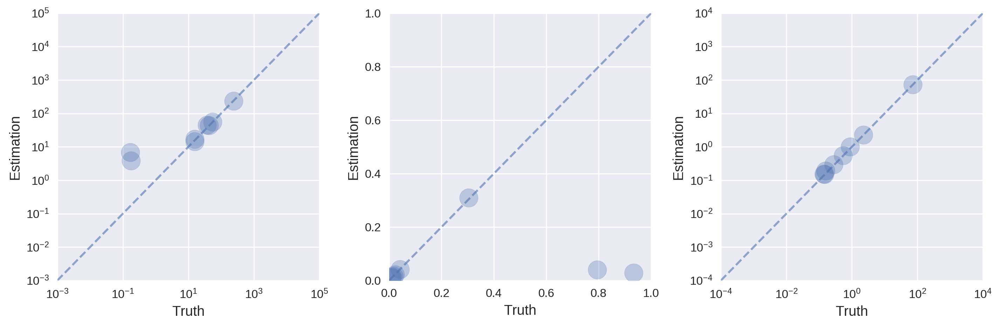

In [21]:
results, truth, seq_list = load_results(
    dataset_dir='/mnt/storage/projects/k-seq/datasets/simulated/on_doped_s1000_d40/',
    result_dir='/mnt/storage/projects/k-seq/working/simu_data/least_squared/s1000_d40_table-seq-in-all-smpl_bs-num-1000_bs-mtd-data_no-zero-false_inv-weight-false_core-40/'
)

input_lim_list = [(0, 10),
                  (10, 100),
                  (100, 1000),
                  (1000, 1e8)]


for input_lim in input_lim_list:
    print(input_lim)
    align_to_truth(df_res=results.loc[seq_list], df_truth=truth.loc[seq_list],
                   cols=['k', 'A', ('kA', 'ka')],
                   lims=[(1e-3, 1e5), (0, 1), (1e-4, 1e4)],
                   use_log=[True, False, True],
                   input_lim=input_lim,
                   markersize=1000
                  )
    plt.show()

(0, 10)


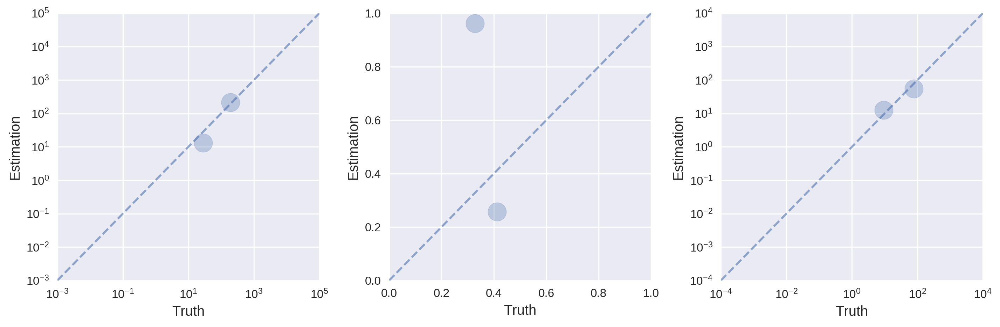

(10, 100)


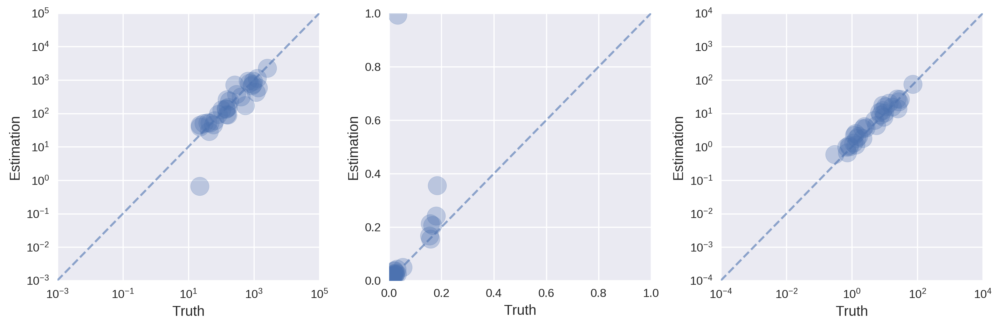

(100, 1000)


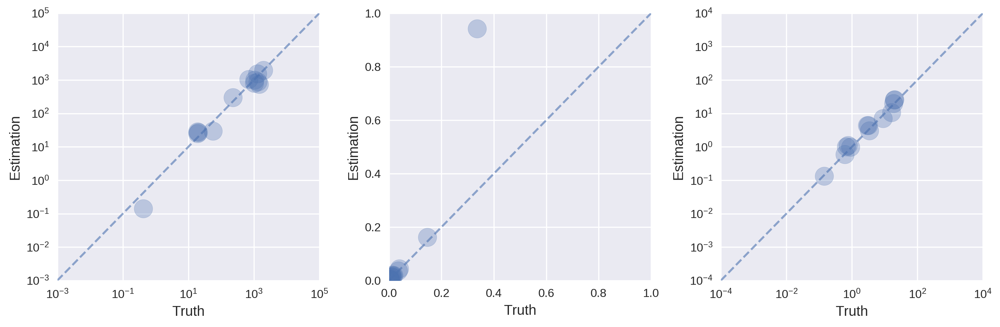

(1000, 100000000.0)


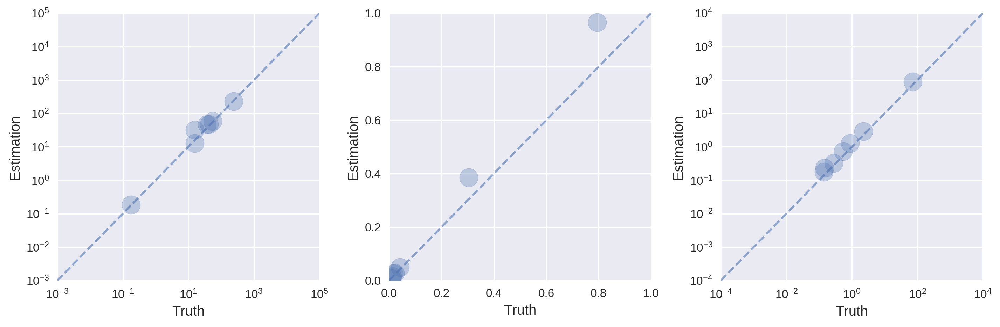

In [23]:
results, truth, seq_list = load_results(
    dataset_dir='/mnt/storage/projects/k-seq/datasets/simulated/on_doped_s1000_d10/',
    result_dir='/mnt/storage/projects/k-seq/working/simu_data/least_squared/s1000_d10_table-seq-in-all-smpl_bs-num-1000_bs-mtd-data_no-zero-false_inv-weight-false_core-40/'
)

input_lim_list = [(0, 10),
                  (10, 100),
                  (100, 1000),
                  (1000, 1e8)]


for input_lim in input_lim_list:
    print(input_lim)
    align_to_truth(df_res=results.loc[seq_list], df_truth=truth.loc[seq_list],
                   cols=['k', 'A', ('kA', 'ka')],
                   lims=[(1e-3, 1e5), (0, 1), (1e-4, 1e4)],
                   use_log=[True, False, True],
                   input_lim=input_lim,
                   markersize=1000
                  )
    plt.show()

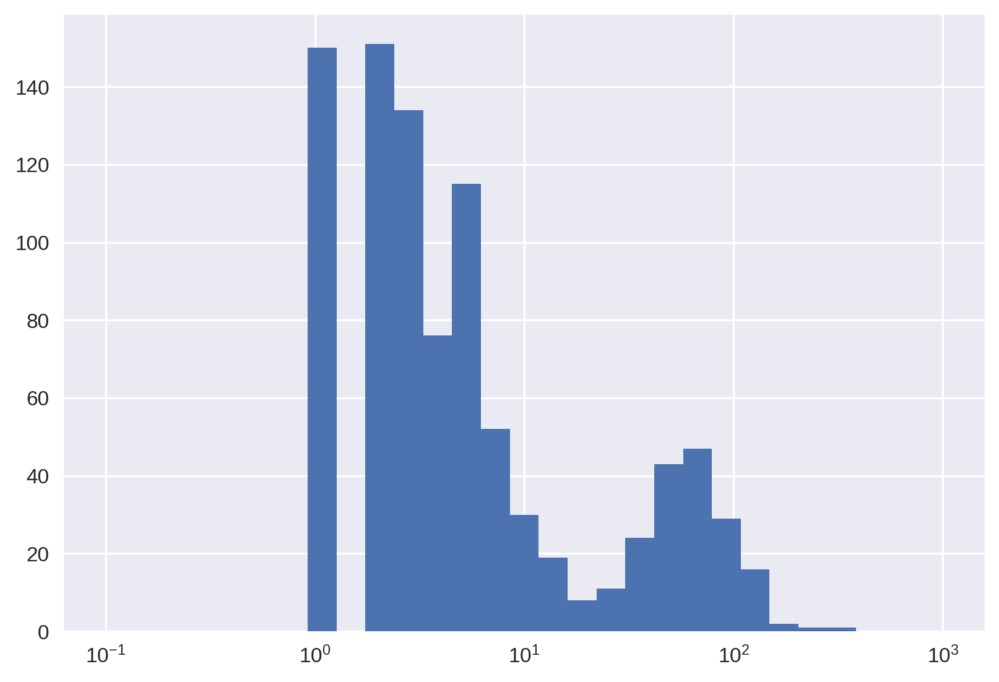

In [29]:
bins = np.logspace(-1, 3, 30)
truth['input_counts'].hist(bins=bins)
plt.xscale('log')

(0, 10)


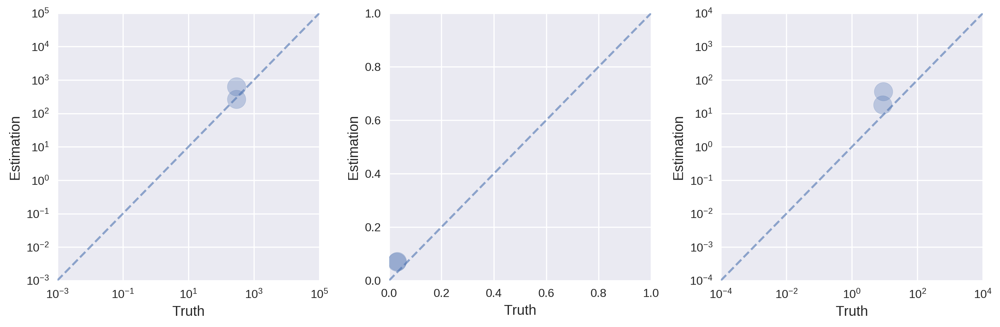

(10, 100)


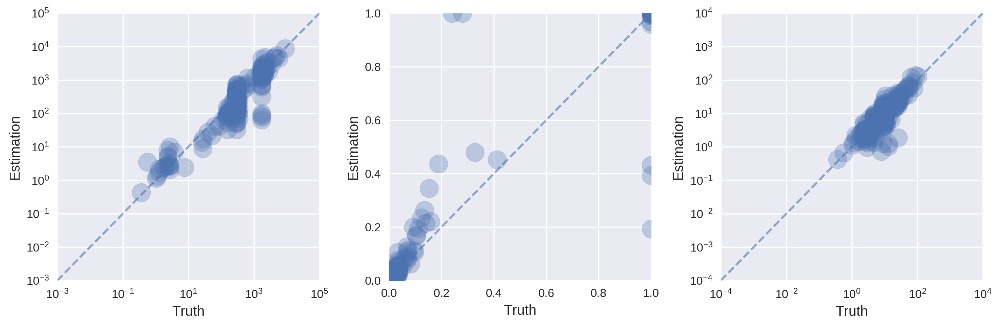

(100, 1000)


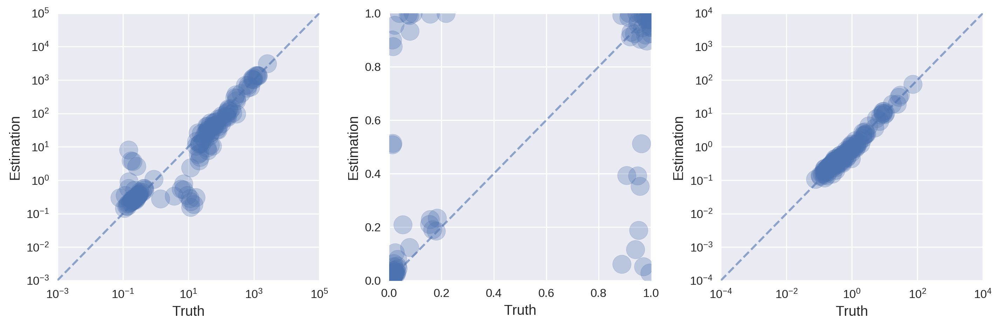

(1000, 100000000.0)


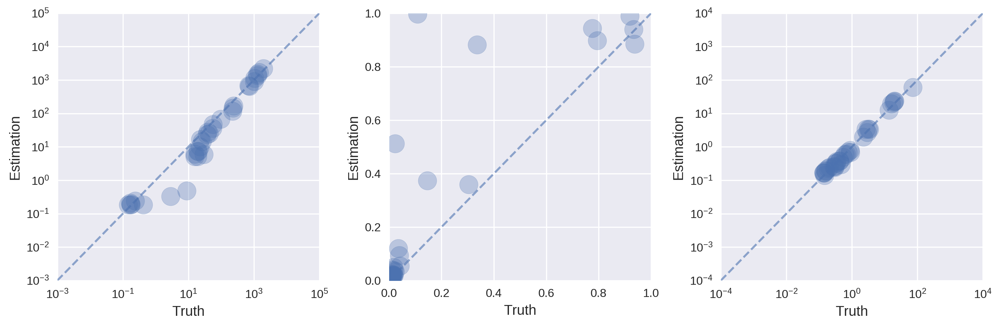

In [22]:
results, truth, seq_list = load_results(
    dataset_dir='/mnt/storage/projects/k-seq/datasets/simulated/on_doped_s1000_d100/',
    result_dir='/mnt/storage/projects/k-seq/working/simu_data/least_squared/s1000_d100_table-seq-in-all-smpl_bs-num-1000_bs-mtd-data_no-zero-false_inv-weight-false_core-40/'
)

input_lim_list = [(0, 10),
                  (10, 100),
                  (100, 1000),
                  (1000, 1e8)]


for input_lim in input_lim_list:
    print(input_lim)
    align_to_truth(df_res=results.loc[seq_list], df_truth=truth.loc[seq_list],
                   cols=['k', 'A', ('kA', 'ka')],
                   lims=[(1e-3, 1e5), (0, 1), (1e-4, 1e4)],
                   use_log=[True, False, True],
                   input_lim=input_lim,
                   markersize=1000
                  )
    plt.show()

# fastq-join results

In [ ]:
results = pd.read_csv('/mnt/storage/projects/k-seq/working/simu_data/least_squared/fastq-join/on_doped_s1000000_d40/table-all-valid_bs-num-0_bs-mtd-data_no-zero-false_inv-weight-false_core-20/', index_col=0)
truth = pd.read_csv('/mnt/storage/projects/k-seq/datasets/simulated/on_doped_s1000000_d40/truth.csv')
seq_list = results.index.values